# Kraken Simulation of Caldera Environment

In [1]:
import numpy as np
from pyat.pyat import env
from matplotlib import pyplot as plt
import pyat_tools
import hvplot.xarray
from tqdm import tqdm
import scipy
import os
from scipy import signal
from pyat.pyat.readwrite import *

import xarray as xr
import hvplot.xarray

import pandas as pd
from Noise_Interferometry.Modules import inversion
import multiprocessing as mp

%load_ext autoreload
%autoreload 2

## Create Environment File

In [2]:
fn = '/Volumes/Ocean_Acoustics/CTD Data_NI/Axial_Base_stitched_hourly.nc'
sspx = xr.load_dataarray(fn)

ssp = pyat_tools.convert_SSP_arlpy(sspx.loc[:,15:1500], 0)

In [3]:
# Write Environment File
fn = 'caldera'
pyat_tools.build_env_file(ssp,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn}.env')

In [4]:
# Build Frequency vector to accurate sample DTFT (so that x(t) can be reconstructed)
Fs = 200
To = 30

t, freq_half, freq_full = pyat_tools.get_freq_time_vectors(Fs, To)

N:	6000
To:	30 [s]
Δf	0.016666666666666666


In [7]:
# Write field flp file
s_depths=[1500] #meters
ranges =  [3.186] #km
r_depths = [1500] # meters

pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn)

removed .flp


## Simulate TDGF

In [11]:
p_f = pyat_tools.simulate_FDGF(fn, [12], fband = [1,90], krakenc=False, verbose=True)

ext .shd


In [12]:
p_f

array([-0.00132175+0.j])

In [112]:
p_t = np.real(scipy.fft.ifft(p_f))

In [130]:
import pickle
fn = 'simulated_pt.pkl'

with open(fn, 'wb') as f:
    pickle.dump({'p_t':p_t, 't':t}, f)

(0.0, 15.0)

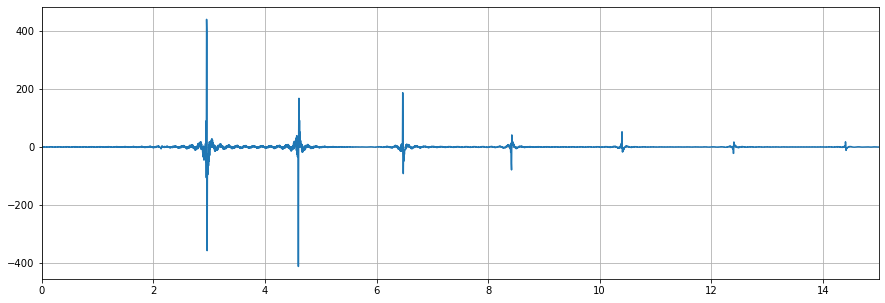

In [129]:
plt.figure(figsize=(15,5))
plt.plot(t, 1e6*p_t)
plt.grid()
plt.xlim((0,15))

### Get arrival times

In [168]:
NCCF = pyat_tools.create_NCCF(np.abs(signal.hilbert(p_t)))


dA = inversion.calc_prop_time(NCCF, 'dA').values[0]*-1
s1b0 = inversion.calc_prop_time(NCCF, 's1b0B').values[0]
s2b1 = inversion.calc_prop_time(NCCF, 's2b1B').values[0]
s3b2 = inversion.calc_prop_time(NCCF, 's3b2B').values[0]

print(dA, s1b0, s2b1, s3b2)

2.1416888174552136 2.959410630347835 4.619553492207257 6.472646637151635


(-1e-05, 1e-05)

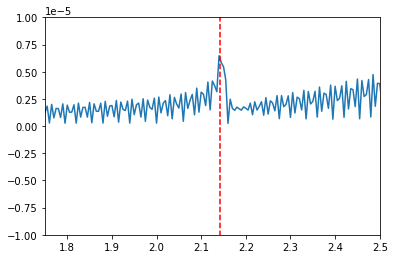

In [169]:
plt.plot(t, np.abs(signal.hilbert(p_t)))
ylims = plt.gca().get_ylim()

plt.plot([dA,dA], ylims, 'r--')
plt.plot([s1b0,s1b0], ylims, 'r--')
plt.plot([s2b1,s2b1], ylims, 'r--')
plt.plot([s3b2,s3b2], ylims, 'r--')


plt.xlim((1.75,2.5))
plt.ylim((-0.00001,0.00001))

## Look at spectrogram of TDGF

In [30]:
# Load SSP information
sspx = pyat_tools.load_ssp_from_file()
ssp_caldera_winter = pyat_tools.convert_SSP_arlpy(sspx, 0)[:-100]

# Write Environment File
fn = 'caldera'
pyat_tools.build_env_file(ssp_caldera_winter,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn}.env')


# Write field flp file
s_depths=[400] #meters
ranges =  [100] #km
r_depths = [400] # meters

pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn)

# Build Frequency vector to accurate sample DTFT (so that x(t) can be reconstructed)
Fs = 200
To = 90

t, freq_half, freq_full = pyat_tools.get_freq_time_vectors(Fs, To)

# Simulate with Kraken
pressures = pyat_tools.simulate_FDGF('caldera', freq_half, [1, 30], krakenc=False, verbose=True)

pt = np.real(scipy.fft.ifft(pressures))

  1%|          | 100/9001 [00:00<00:09, 903.69it/s]

removed .flp
N:	18000
To:	90 [s]
Δf	0.005555555555555556


100%|██████████| 9001/9001 [00:59<00:00, 152.19it/s]


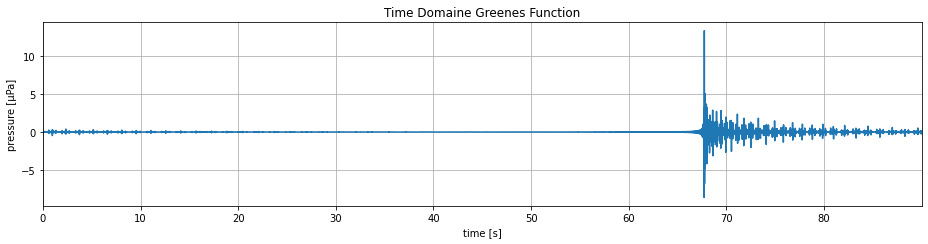

In [31]:
plt.figure(figsize=(13,3.5))
plt.plot(t, np.real(pt)/1e-6)
plt.grid()
plt.xlim((t[0],t[-1]))
plt.xlabel('time [s]')
plt.ylabel('pressure [μPa]')
plt.title('Time Domaine Greenes Function')

#plt.ylim((-200,200))
#plt.xlim((1.5,15))
plt.tight_layout()
#plt.savefig(f'figures/TDGF_1_90_zoomed_rough_rock.png',dpi=300)

In [32]:
pt_upsamp = signal.resample(pt, len(pt)*100)

In [33]:
f, t_spec, Sxx = signal.spectrogram(pt_upsamp, fs=20000, window='hann', nperseg=1024, noverlap=0.9, nfft=4096*4, detrend='constant', return_onesided=True, scaling='density', axis=- 1, mode='psd')

In [34]:
spec = xr.DataArray(10*np.log10(Sxx), dims=['frequency','time'], coords={'time':t_spec, 'frequency':f})

In [35]:
spec.loc[:100,:].hvplot(rasterize=True, width=1300, height=500, x='time', y='frequency', title='Spectrogram of TDGF', cmap='jet')

:DynamicMap   []
   :Image   [time,frequency]   (value)

## Simulate Seasonal TDGF

In [14]:
fn1 = 'caldera_winter'
fn2 = 'caldera_summer'
# Write Environment file
pyat_tools.build_env_file(ssp_caldera_winter,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn1}.env')
pyat_tools.build_env_file(ssp_caldera_summer,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn2}.env')
# Write field flp file
s_depths=[1499] #meters
ranges =  [3.2] #km
r_depths = [1499] # meters

pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn1)
pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn2)

removed .flp
removed .flp


In [15]:
# Build Frequency vector to accurate sample DTFT (so that x(t) can be reconstructed)
Fs = 200
To = 15

t, freq_half, freq_full = pyat_tools.get_freq_time_vectors(Fs, To)

N:	3000
To:	15 [s]
Δf	0.03333333333333333


In [19]:
# Simulate with Kraken
pressures_winter = pyat_tools.simulate_FDGF('caldera_winter', freq_half, [1, 90], krakenc=False)
pressures_summer = pyat_tools.simulate_FDGF('caldera_summer', freq_half, [1, 90], krakenc=False)


100%|██████████| 1501/1501 [00:52<00:00, 28.37it/s]


In [20]:
pt_winter = xr.DataArray(np.real(scipy.fft.ifft(pressures_winter)), dims=['time'], coords={'time':t}, name='G(t) winter')
pt_summer = xr.DataArray(np.real(scipy.fft.ifft(pressures_summer)), dims=['time'], coords={'time':t}, name='G(t) summer')


In [22]:
pt_winter.hvplot(grid=True, label='winter')* pt_summer.hvplot(label='summer')

:Overlay
   .Curve.Winter :Curve   [time]   (G(t) winter)
   .Curve.Summer :Curve   [time]   (G(t) summer)

In [30]:
xr.concat([pt_winter, pt_summer], dim='date')

<xarray.DataArray 'G(t) winter' (date: 2, time: 3000)>
array([[-4.78419585e-07,  2.40458011e-07,  3.54809501e-08, ...,
         4.90768812e-07, -7.77596806e-07,  5.33345940e-07],
       [-5.21395455e-07,  2.78993539e-07, -2.06270011e-08, ...,
         4.93262643e-07, -7.84592156e-07,  5.59115167e-07]])
Coordinates:
  * time     (time) float64 0.0 0.005 0.01 0.015 0.02 ... 14.98 14.98 14.99 15.0
Dimensions without coordinates: date

In [31]:
pt_winter.shape

(3000,)

# Play with multiprocessing

In [3]:
def function(k):
    return mp.current_process().name

In [4]:
a_pool = mp.Pool(processes = mp.cpu_count())
result = a_pool.map(function, range(100))

Process ForkPoolWorker-4:
Process ForkPoolWorker-11:
Process ForkPoolWorker-9:
Process ForkPoolWorker-5:
Process ForkPoolWorker-12:
Process ForkPoolWorker-8:
Process ForkPoolWorker-7:
Process ForkPoolWorker-6:
Process ForkPoolWorker-3:
Process ForkPoolWorker-2:
Process ForkPoolWorker-1:
Process ForkPoolWorker-10:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):


In [2]:
# build function that calculates the TDGF for a single SSP, but can be iterated over

def simulate_single_ssp(ssp):
    '''
    simulate_single_SSP builds upon pyat_tools.simulate_TDGF() and calculates
        the 
    
    Parameters
    ----------
    ssp : numpy array
        sound speed profile in numpy format required by arlpy
        
    Returns
    -------
    TDGF : numpy array
    '''
    
    process_name = mp.current_process().name
    
    # Write Environment File
    fn = f'multiprocessing/caldera_{process_name}'
    
    pyat_tools.build_env_file(ssp,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn}.env')
    
    # Build Frequency vector to accurate sample DTFT (so that x(t) can be reconstructed)
    Fs = 200
    To = 20
    t, freq_half, freq_full = pyat_tools.get_freq_time_vectors(Fs, To, verbose=False)

    # Write field flp file
    s_depths=[1499] #meters
    ranges =  [3.2] #km
    r_depths = [1499] # meters

    pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn, verbose=False)
    
    # Simulate with Kraken
    pressures = pyat_tools.simulate_FDGF(fn, freq_half, [1, 90], krakenc=False)

    pt = np.real(scipy.fft.ifft(pressures))
    
    return pt

### Get SSPs

In [3]:
fn = '/Volumes/Ocean_Acoustics/CTD Data/Axial_Base_201hr_avg_SSP.nc'
ssps = xr.load_dataarray(fn)

In [4]:
ssps_single_year = ssps[::200,:].loc[pd.Timestamp('2016-01-01'):pd.Timestamp('2017-01-01'),11:1527]

In [5]:
ssp_ls = []

for k in range(len(ssps_single_year)):
    ssp_ls.append(pyat_tools.convert_SSP_arlpy(ssps_single_year,k))

In [7]:
len(ssp_ls)

44

### Simulate TDGF for every SSP

In [8]:
a_pool = mp.Pool(processes = mp.cpu_count())
#result = a_pool.map(simulate_single_ssp, ssp_ls)

  0%|          | 0/2001 [00:00<?, ?it/s]

In [ ]:
r = list(tqdm(a_pool.imap(simulate_single_ssp, ssp_ls), total=len(ssp_ls)))

  0%|          | 0/44 [00:00<?, ?it/s]

In [10]:
import pickle
fn = 'TDGFs2.pkl'

with open(fn, 'wb') as f:
    pickle.dump(r, f)

In [11]:
TDGFs_np = np.array(r)

In [12]:
TDGFs_np.shape

(44, 4000)

In [13]:
# get time coord
Fs = 200
To = 20
t, _, _ = pyat_tools.get_freq_time_vectors(Fs, To, verbose=False)

In [14]:
TDGFs = xr.DataArray(
    TDGFs_np,
    dims=['dates','delay'],
    coords={
        'dates':ssps_single_year.time.values,
        'delay':t
    },
    name='Simulated TDGFs'
)

fn = 'yearlong_TDGF_simulated.nc'

TDGFs.to_netcdf(fn)

In [15]:
TDGFs.hvplot(x='dates', y='delay')

:Image   [dates,delay]   (Simulated TDGFs)

### Calculate Arrival Times using peak interpolation

In [17]:
from Noise_Interferometry.Modules import inversion

In [27]:
s1b0_proptime = inversion.calc_prop_time(TDGFs, 'custom', peak_slice = [593-50, 593+50])
s2b1_proptime = inversion.calc_prop_time(TDGFs, 'custom', peak_slice = [900-100, 900+100])
s3b2_proptime = inversion.calc_prop_time(TDGFs, 'custom', peak_slice = [1295-50, 1295+50])
s4b3_proptime = inversion.calc_prop_time(TDGFs, 'custom', peak_slice = [1684-50, 1684+50])

dt_s1b0 = 1000*(s1b0_proptime.max() - s1b0_proptime.min()).values
dt_s2b1 = 1000*(s2b1_proptime.max() - s2b1_proptime.min()).values
dt_s3b2 = 1000*(s3b2_proptime.max() - s3b2_proptime.min()).values
dt_s4b3 = 1000*(s4b3_proptime.max() - s4b3_proptime.min()).values

In [28]:
dt_s1b0, dt_s2b1, dt_s3b2, dt_s4b3

(1.4282161815102334, 35.10183411823142, 4.732393719058869, 5.703881651960785)

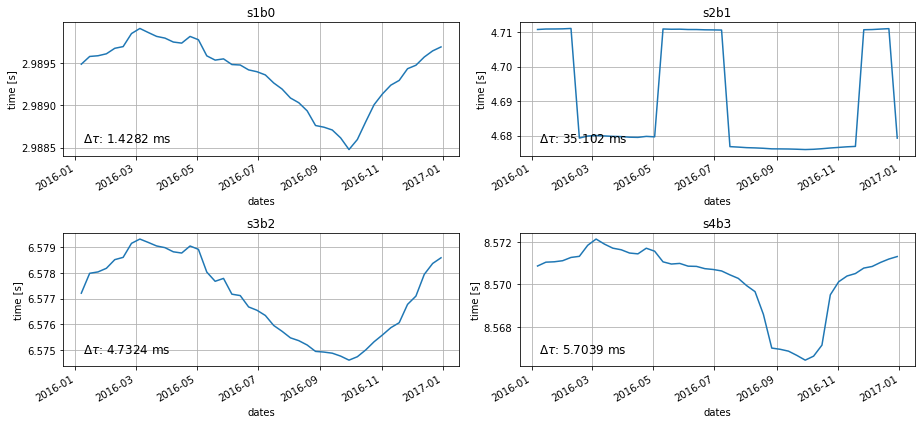

In [29]:
plt.figure(figsize=(13,6))

plt.subplot(2,2,1)
s1b0_proptime.plot()
plt.grid()
plt.ylabel('time [s]')
plt.title('s1b0')
ax = plt.gca()
plt.text(0.05, 0.1, f'$\Delta \\tau$: {dt_s1b0:0.5} ms', transform=ax.transAxes, fontsize=12)


plt.subplot(2,2,2)
s2b1_proptime.plot()
plt.grid()
plt.ylabel('time [s]')
plt.title('s2b1')
ax = plt.gca()
plt.text(0.05, 0.1, f'$\Delta \\tau$: {dt_s2b1:0.5} ms', transform=ax.transAxes, fontsize=12)

plt.subplot(2,2,3)
s3b2_proptime.plot()
plt.grid()
plt.ylabel('time [s]')
plt.title('s3b2')
ax = plt.gca()
plt.text(0.05, 0.1, f'$\Delta \\tau$: {dt_s3b2:0.5} ms', transform=ax.transAxes, fontsize=12)

plt.subplot(2,2,4)
s4b3_proptime.plot()
plt.grid()
plt.ylabel('time [s]')
plt.title('s4b3')
plt.tight_layout()
ax = plt.gca()
plt.text(0.05, 0.1, f'$\Delta \\tau$: {dt_s4b3:0.5} ms', transform=ax.transAxes, fontsize=12)

plt.savefig('simulated_arrival_times.png', dpi=300)

## Get 6-year average TDGF and arrival times

In [1]:
import xarray as xr
import pandas as pd
import pyat_tools
from matplotlib import pyplot as plt
from Noise_Interferometry.Modules import inversion
import numpy as np
from scipy import signal
import hvplot.xarray

%load_ext autoreload
%autoreload 2

In [2]:
fn = '/Volumes/Ocean_Acoustics/CTD Data/Axial_Base_201hr_avg_SSP.nc'
ssps = xr.load_dataarray(fn)

In [3]:
ssps_single_year = ssps[::200,:].loc[pd.Timestamp('2016-01-01'):pd.Timestamp('2017-01-01'),11:1500]

In [4]:
ssp_arlpy = pyat_tools.convert_SSP_arlpy(ssps_single_year.mean('time'), 0)

In [71]:
pt = pyat_tools.simulate_single_ssp(ssp_arlpy)

100%|██████████| 2001/2001 [01:11<00:00, 28.09it/s]


In [72]:
t,_,_ = pyat_tools.get_freq_time_vectors(200, 30, verbose=False)
pt_pad = np.hstack((pt, np.zeros(2000)))

pt_pad = np.expand_dims(np.hstack((np.flipud(pt_pad[1:]), pt_pad)),0)

NCCF_sim = xr.DataArray(
    pt_pad,
    dims=['dates','delay'],
    coords = {'delay':np.hstack((-np.flipud(t[1:]), t))}
)

In [73]:
NCCF_simc = xr.DataArray(
    np.abs(signal.hilbert(NCCF_sim)),
    dims=['dates','delay'],
    coords={'delay':NCCF_sim.delay}, 
    name='Hilbert magnitude simulated NCCF')

In [74]:
NCCF_simc

<xarray.DataArray 'Hilbert magnitude simulated NCCF' (dates: 1, delay: 11999)>
array([[4.99890486e-11, 5.00947333e-11, 4.98837071e-11, ...,
        4.98837071e-11, 5.00947333e-11, 4.99890486e-11]])
Coordinates:
  * delay    (delay) float64 -30.0 -29.99 -29.98 -29.98 ... 29.98 29.99 30.0
Dimensions without coordinates: dates

In [75]:
prop_times = {}

prop_times['d'] = -1*inversion.calc_prop_time(NCCF_simc, 'dA',verbose=False).values[0]
prop_times['s1b0'] = inversion.calc_prop_time(NCCF_simc, 's1b0B',verbose=False).values[0]
prop_times['s2b1'] = inversion.calc_prop_time(NCCF_simc, 's2b1B',verbose=False).values[0]
prop_times['s3b2'] = inversion.calc_prop_time(NCCF_simc, 's3b2B',verbose=False).values[0]

print(prop_times)

{'d': 2.1420902736405885, 's1b0': 2.9592706879764696, 's2b1': 4.61936691191464, 's3b2': 6.472292345167488}


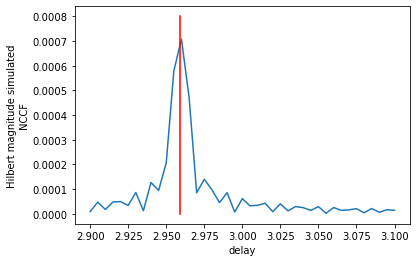

In [76]:
NCCF_simc.loc[:,2.9:3.1].plot()
plt.plot([prop_times['s1b0'], prop_times['s1b0']], [-0.000,0.0008], 'red')

#### Now do it for constant sound speed

In [6]:
c0 = ssps_single_year.mean()
c0

<xarray.DataArray '201 hour average SSP' ()>
array(1480.13167186)

In [58]:
ssp = np.ones(len(ssp_arlpy))*c0.values
ssp_arlpy_const = ssp_arlpy
ssp_arlpy_const[:,1] = ssp

In [59]:
pt = pyat_tools.simulate_single_ssp(ssp_arlpy_const)

100%|██████████| 2001/2001 [01:11<00:00, 28.10it/s]


In [60]:
t,_,_ = pyat_tools.get_freq_time_vectors(200, 30, verbose=False)
pt_pad = np.hstack((pt, np.zeros(2000)))

pt_pad = np.expand_dims(np.hstack((np.flipud(pt_pad[1:]), pt_pad)),0)

pt_padc = np.abs(signal.hilbert(pt_pad))

NCCF_sim = xr.DataArray(
    pt_padc,
    dims=['dates','delay'],
    coords = {'delay':np.hstack((-np.flipud(t[1:]), t))}
)

In [61]:
prop_times_c0 = {}

prop_times_c0['d'] = -1*inversion.calc_prop_time(NCCF_sim, 'dA',verbose=False).values[0]
prop_times_c0['s1b0'] = inversion.calc_prop_time(NCCF_sim, 's1b0B',verbose=False).values[0]
prop_times_c0['s2b1'] = inversion.calc_prop_time(NCCF_sim, 's2b1B',verbose=False).values[0]
prop_times_c0['s3b2'] = inversion.calc_prop_time(NCCF_sim, 's3b2B',verbose=False).values[0]

print(prop_times_c0)

{'d': 2.1518053904100616, 's1b0': 2.9594750700101993, 's2b1': 4.6196521823679255, 's3b2': 6.472726277752508}


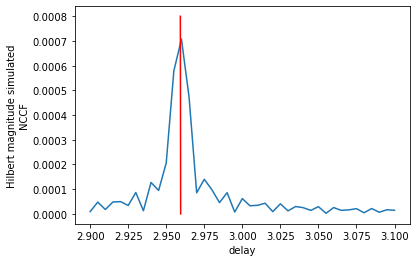

In [77]:
NCCF_simc.loc[:,2.9:3.1].plot()
plt.plot([prop_times_c0['s1b0'], prop_times['s1b0']], [-0.000,0.0008], 'red')

## Geometric Approximation

In [62]:
c0

<xarray.DataArray '201 hour average SSP' ()>
array(1480.13167186)

In [63]:
R = 3186 #m
D = 1500 #m

L_s1b0 = 2*np.sqrt((R/2)**2 + D**2)
L_s2b1 = 4*np.sqrt((R/4)**2 + D**2)
L_s3b2 = 6*np.sqrt((R/6)**2 + D**2)

In [64]:
s1b0_geo = L_s1b0/c0.values
s2b1_geo = L_s2b1/c0.values
s3b2_geo = L_s3b2/c0.values

In [65]:
prop_time_geo = {'s1b0':s1b0_geo, 's2b1':s2b1_geo, 's3b2':s3b2_geo}

In [66]:
print(prop_time_geo)

{'s1b0': 2.956587902063566, 's2b1': 4.5897423350603415, 's3b2': 6.450292435355626}
